# Проектная работа. Рынок заведений общественного питания Москвы

## Описание проекта <a id='section_id'></a>

Заказчики исследования - инвесторы рынка общественного питания Москвы.

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках.

Наша задача - подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.


## План выполнения работ

**Подготовка**

  1.0 Импорт библиотек

  1.2 Загрузка данных

  1.3 Обзор данных


**Предобработка данных**

 2.1 Обработка дубликатов

 2.2 Анализ и заполнение пропусков

 2.3 Добавление новых колонок

**Исследовательский анализ даных**

 3.1 Распределение объектов по категориям

 3.2 Количество посадочных мест в местах по категориям

 3.3 Соотношение сетевых и несетевых заведений

 3.4 Топ-15 мест по популчрности

 3.5 Исследование районов Москвы

 3.6 Средние рейтинги по категориям

 3.7 Круглосуточные заведения

 3.8 Заведения с низким рейтингом


**Исследовательский анализ даных. Рынок кофеен**

4.1 Круглосуточные кофейни

4.2 Топ-10 кофеен по популярности

**Выводы**

## Подготовка

### 1.0 Импорт библиотек

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import re
import folium
import json
from folium import Map, Choropleth
from folium import Marker, Map
from plotly import graph_objects as go
pd.options.display.float_format = '{: .2f}'.format


### 1.2 Загрузка данных

In [2]:
df = pd.read_csv('https://getfile.dokpub.com/yandex/get/https://disk.yandex.ru/d/5o0NLo7iX6rY7A', sep=',')

In [3]:
df.sample(1)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
6527,Менга,ресторан,"Москва, Ленинский проспект, 158с2",Западный административный округ,"ежедневно, 11:00–23:00",55.65,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN


### 1.3 Обзор данных

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В датасете - 13 колонок.

name — название заведения (тип - object, пропусков нет

address — адрес заведения(тип - object, пропусков нет);

district — административный район, в котором находится заведение
(тип bject, пропусков нет);

category — категория заведения(тип - object, пропусков нет);

hours — информация о днях и часах работы((тип - object, есть пропуски)

lat — широта географической точки, в которой находится заведение (тип - float, пропусков нет);

lng — долгота географической точки, в которой находится заведение(тип - float, пропусков нет);

rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0)(тип - object,пропусков  нет);

price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона (тип - object, пропуски есть)

middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill (тип float, пропуски есть);

middle_coffee_cup — число с оценкой одной чашки капучино, (тип float, пропуски есть);

chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым
0 — заведение не является сетевым
1 — заведение является сетевым
(тип - int, пропусков нет);

seats — количество посадочных мест(тип float, пропуски есть)




## Предобработка данных

### 2.1 Обработка дубликатов

In [5]:
df.duplicated().sum()

0

In [6]:
df[['name','address']].duplicated().sum()

0

In [7]:
df_test = df.copy(deep=True)

In [8]:
df_test['name'] = df_test['name'].str.lower()
df_test['address'] = df_test['address'].str.lower()
df_test[['name','address']].duplicated().sum()

4

In [9]:
df_dup = df_test[df_test[['name','address']].duplicated()]
df_test.query('(name in @df_dup.name)& (address in @df_dup.address)')
df.drop(labels = [215,1511,2420, 3109], axis = 0, inplace = True)
df_test1 = df.copy(deep=True)
df_test1['name'] = df_test['name'].str.lower()
df_test1['address'] = df_test['address'].str.lower()
df_test1[['name','address']].duplicated().sum()

0

Мы сделали копию датафрейма, перевели названия и адреса в нижний регистр и обнаружили 4 дубликата (полностью совпадали адреса и названия). Мы удалили дубли из основного датафрейма

В датасете отсутствуют полные дубликаты а также заведения, у которых совпадают названия и адрес. Проверим, есть ли в датафрейме заведения, с повторяющимися названиями, не принадлежащие к сетевым заведениям

In [10]:
df[df['name'].duplicated()].query('chain == 0')['name'].unique()

array(['Кафе', 'Шаурма', 'Ресторан', 'Столовая', 'Кафе-столовая', 'Буфет',
       'Кофейня', 'Бистро', 'Шашлычная', 'Пиццерия', 'Блины', 'Трапезная',
       'Поминальные обеды', 'Кафе для поминок', 'Чебуречная',
       'Кафе-кулинария'], dtype=object)

Мы видим, что в датафрейме присутствуют повторяющиеся названия заведений 'без названия'. Это может быть кафе, которое называется 'кафе' или ресторан, который называется 'рестран'. Оставим такие записи без изменения

### 2.2 Анализ и заполнение пропусков

In [11]:
df['hours'] = df['hours'].fillna('unknown')

Заполним пропуски в колонке часы на значения 'unknown'. В нашем датафрейме также присутствуют пропуски в колонках, связанных с ценой или количеством мест. У нас нет достаточных оснований их заполнять, так что оставим пропуски как есть.


### 2.3 Добавление новых колонок

In [12]:
df['street'] = df['address'].apply(lambda x: x.split(',')[1].strip())

In [13]:
df['is_24/7'] = df['hours'].apply(lambda x: ('ежедневно' in x) & ('круглосуточно' in x))

In [14]:
df.sample()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
2294,Bakery,кафе,"Москва, Олимпийский проспект, 18/1",Центральный административный округ,"ежедневно, 08:00–20:00",55.79,37.62,4.30,NaN,NaN,NaN,NaN,1,481.00,Олимпийский проспект,False


Мы создали столбец 'street' с названиями улиц из столбца с адресом.
Мы также создали столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
логическое значение True — если заведение работает ежедневно и круглосуточно;
логическое значение False — в противоположном случае.

## Исследовательский анализ данных<a id="research"></a>

### 3.1 Распределение объектов по категориям

Какие категории заведений представлены в данных? Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Это поможет нам оттветить на вопрос о распределении заведений по категориям.

In [15]:
dfp1 = df.pivot_table(index= 'category',  values= ['name', 'seats', 'rating'], aggfunc={'name': 'count', 'seats': 'median', 'rating' : 'median'})
df1 = dfp1.reset_index().rename(columns = {'name': 'количество в датасете', 'category': 'название категории'})
df1

,название категории,количество в датасете,rating,seats
0,"бар,паб",764,4.40,82.00
1,булочная,256,4.30,50.00
2,быстрое питание,603,4.20,65.00
3,кафе,2376,4.20,60.00
4,кофейня,1413,4.30,80.00
5,пиццерия,633,4.30,55.00
6,ресторан,2042,4.30,86.00
7,столовая,315,4.30,75.50


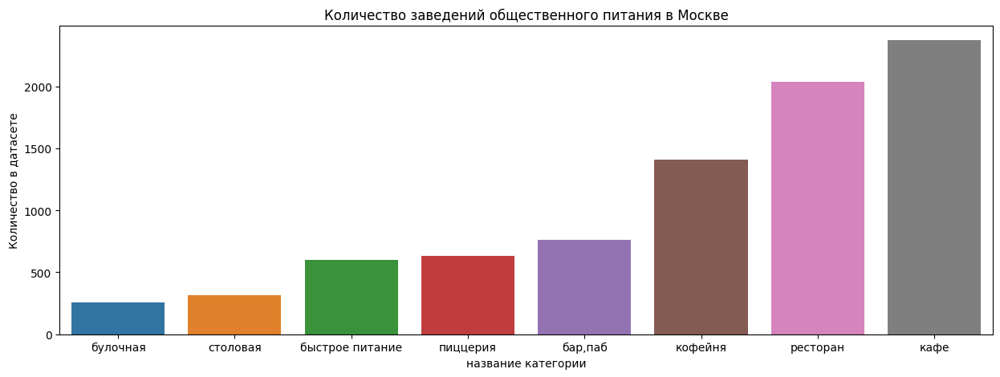

In [16]:
plt.figure(figsize=(15, 5))
sns.barplot(
    data = df1.sort_values(by = 'количество в датасете'),
    x='название категории', y='количество в датасете').set(title = 'Количество заведений общественного питания в Москве')
plt.ylabel("Количество в датасете")
plt.show()

**Выводы:** Мы видим, что большая часть заведений относится к категориям 'кафе', 'ресторан', 'кофейня'

### 3.2 Количество посадочных мест в местах по категориям

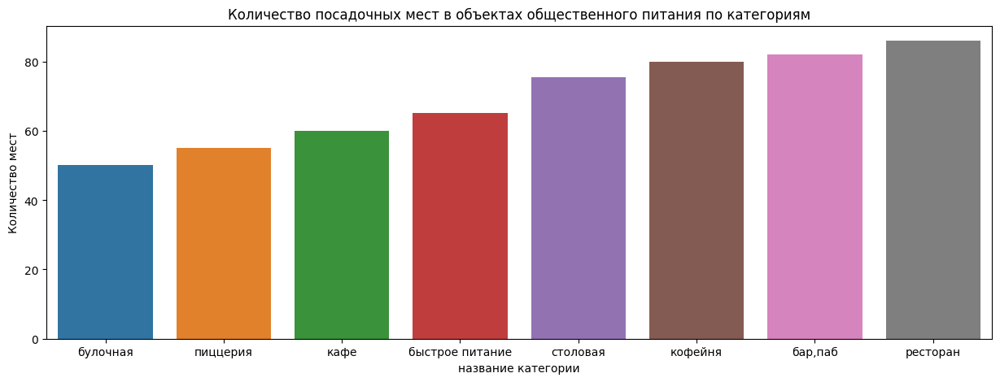

In [17]:
plt.figure(figsize=(15, 5))
sns.barplot(
    data = df1.sort_values(by = 'seats'),
    x='название категории', y='seats').set(title = 'Количество посадочных мест в объектах общественного питания по категориям')
plt.ylabel("Количество мест")
plt.show()

В таблице df1 мы посчитали медианное значение по количеству мест для каждой категории. Мы видим, что в ресторане в среднем 86 посадочных мест, а баре - 82, а в кофейне 80.

In [18]:
def make_boxplots(df,x1, y1, hue1, title1, xlab, ylab):
  plt.figure(figsize=(15, 5))
  sns.set_theme(style="ticks", palette="pastel")
  ax = sns.boxplot(data=df, x= x1, y=y1, hue=hue1, palette=["m", "g"])
  ax.set(title=title1)
  plt.ylabel(ylab)
  plt.xlabel(xlab)
  legend_labels = ['Не сетевое', 'Сетевое']
  legend_colors = ['m', 'g']
  handles, _ = ax.get_legend_handles_labels()
  legend = plt.legend(handles, legend_labels, title='тип заведения')
  for text, color in zip(legend.get_texts(), legend_colors):
    text.set_color(color)
  legend.get_texts()[0].set_color('black')
  legend.get_texts()[1].set_color('black')
  plt.show()

Мы создали функцию, котрая строит диаграммы размаха по  датафрейму

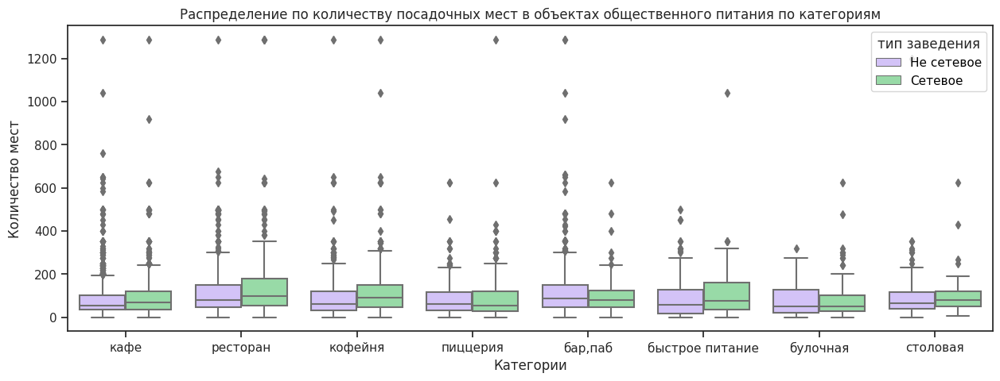

In [19]:
make_boxplots(df, 'category', 'seats', 'chain', 'Распределение по количеству посадочных мест в объектах общественного питания по категориям', 'Категории', 'Количество мест')

**Как соотносятся рапсределения по количеству мест сетевых и несетевых заведений?**  Мы видим, что у кафе, ресторана и кофейни в сетевых заведениях обычно больше посадочных мест (медиана а также максимальные значения до выбросов выше)


### 3.3 Соотношение сетевых и несетевых заведений в датасете.

In [20]:
chain = sum(df['chain'])

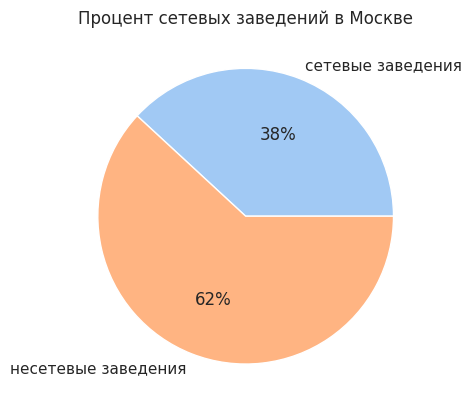

In [21]:
data =  [sum(df['chain']), len(df)-sum(df['chain'])]
labels = ['сетевые заведения', 'несетевые заведения']
colors = sns.color_palette('pastel')[0:5]
plt.pie(data, labels = labels, colors = colors, autopct='%.0f%%')
plt.title('Процент сетевых заведений в Москве')
plt.show()

Вывод: Мы видим, что в датасете 61.9% заведений несетевых (их всего 5199) и 38.1 % заведений сетевых (их 3203)

**Какие категории заведений чаще являются сетевыми?**

In [22]:
dfp2 = df.pivot_table(index= ['category', 'chain'], values= ['name', 'seats', 'rating'], aggfunc={'name': 'count', 'seats': 'median','rating': 'median'})
df2 = dfp2.reset_index()
df2['chain'] = df2['chain'].replace(0, 'несетевое заведение').replace(1, 'сетевое заведение')
df2

,category,chain,name,rating,seats
0,"бар,паб",несетевое заведение,596,4.40,85.00
1,"бар,паб",сетевое заведение,168,4.40,78.50
2,булочная,несетевое заведение,99,4.30,50.00
3,булочная,сетевое заведение,157,4.30,50.00
4,быстрое питание,несетевое заведение,371,4.20,56.00
5,быстрое питание,сетевое заведение,232,4.20,75.00
6,кафе,несетевое заведение,1597,4.20,55.00
7,кафе,сетевое заведение,779,4.30,70.00
8,кофейня,несетевое заведение,693,4.40,60.00
9,кофейня,сетевое заведение,720,4.20,90.00


In [23]:
df_chain1 = df.pivot_table (index = 'category', values = ['chain'], aggfunc = {'count', 'sum'})
df_chain1.columns = ['всего', 'сетевых заведений']
df_chain1['доля сетевых заведений в %'] = df_chain1['сетевых заведений']/df_chain1['всего']*100
df_chain1 = df_chain1.sort_values(by = 'доля сетевых заведений в %')
df_chain1

,всего,сетевых заведений,доля сетевых заведений в %
category,,,
"бар,паб",764,168,21.99
столовая,315,88,27.94
кафе,2376,779,32.79
ресторан,2042,729,35.70
быстрое питание,603,232,38.47
кофейня,1413,720,50.96
пиццерия,633,330,52.13
булочная,256,157,61.33


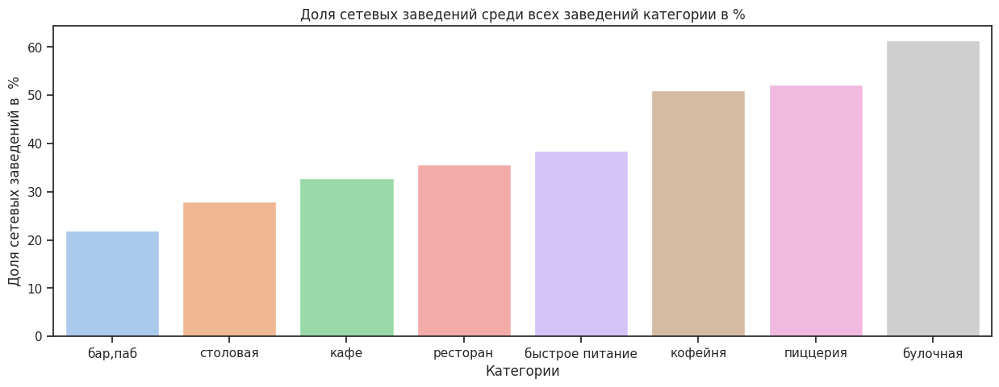

In [24]:
plt.figure(figsize=(15, 5))
sns.barplot(
    data = df_chain1.sort_values(by = 'доля сетевых заведений в %'),
    x=df_chain1.index, y='доля сетевых заведений в %').set(title = 'Доля сетевых заведений среди всех заведений категории в %')
plt.ylabel("Доля сетевых заведений в  %")
plt.xlabel("Категории")
plt.show()

Мы видим, что самая большая доля сетевых заведений среди всех заведений категории среди булочных (примерно 61%). Далее идут  пицериии (52%) и кофейни (50%)

Мы видим, что у заведений категорий 'булочная', 'пиццерия' и 'кофейня' количество сетевых заведений больше, чем несетевых.
Среди баров, кафе и ресторанов, наоборот, значительно больше несетевых заведений.

### 3.4 Найдем и исследуем топ-15 популярных сетей в Москве

In [25]:
df3 = df.query('chain == 1').groupby('name')['name'].count().sort_values(ascending=False).head(15)
df3

name
Шоколадница                            120
Домино'с Пицца                          76
Додо Пицца                              74
One Price Coffee                        71
Яндекс Лавка                            69
Cofix                                   65
Prime                                   50
Хинкальная                              44
КОФЕПОРТ                                42
Кулинарная лавка братьев Караваевых     39
Теремок                                 38
Чайхана                                 37
CofeFest                                32
Буханка                                 32
Му-Му                                   27
Name: name, dtype: int64

Мы нашли список Топ-15 заведений Москвы по популярности. Посмотрим к, каким категориям они относятся

In [26]:
df.query('name in @df3.index').groupby(['name','category'])['category'].count()

name                                 category       
CofeFest                             кафе                 1
                                     кофейня             31
Cofix                                кофейня             65
One Price Coffee                     кофейня             71
Prime                                кафе                 1
                                     ресторан            49
Буханка                              булочная            25
                                     кафе                 1
                                     кофейня              6
Додо Пицца                           пиццерия            74
Домино'с Пицца                       пиццерия            76
КОФЕПОРТ                             кофейня             42
Кулинарная лавка братьев Караваевых  кафе                39
Му-Му                                бар,паб              1
                                     быстрое питание      2
                                     кафе      

Мне интересно сравнить каждое из самых популярных сетевых заведений с типовым заведением этой категории. Для этого я присвоила каждому заведений одну категорию и сравнивала ее со свойствами типовых заведений этой же категории.

Как же присвоить одну категорию? Для большинства заведений я просто брала самую частотно встречающуюся категорию. Но есть несколько исключений:
 Prime -  я присвоила значение кафе,

 Теремок - я присовила значене "быстрое питание'

 Яндекс лавка - я присовила значение 'доставка'

 Мне кажется некорректным сравнивать эти заведения  с ресторанами

In [27]:
dfpnew = (
          df.query('name in @df3.index').pivot_table
          (index = 'name',
          values = ['middle_avg_bill', 'rating'],
          aggfunc = { 'middle_avg_bill':'median', 'rating': 'mean'})
)
dfpnew['category'] = ['кофейня', 'кофейня','кофейня', 'кафе', 'булочная', 'пиццерия', 'пиццерия', 'кофейня', 'кафе', 'кафе', 'быстрое питание', 'кафе', 'кафе','кофейня', 'доставка']
dfpnew
dfpnew.columns = ['средний счет',  'рейтинг','category']
df4 = dfpnew.reset_index()
df4

,name,средний счет,рейтинг,category
0,CofeFest,512.50,3.98,кофейня
1,Cofix,NaN,4.08,кофейня
2,One Price Coffee,NaN,4.06,кофейня
3,Prime,300.00,4.12,кафе
4,Буханка,237.50,4.40,булочная
5,Додо Пицца,391.50,4.29,пиццерия
6,Домино'с Пицца,500.00,4.17,пиццерия
7,КОФЕПОРТ,NaN,4.15,кофейня
8,Кулинарная лавка братьев Караваевых,450.00,4.39,кафе
9,Му-Му,450.00,4.23,кафе


In [28]:
df_cat = df4.groupby('category')['name'].count()

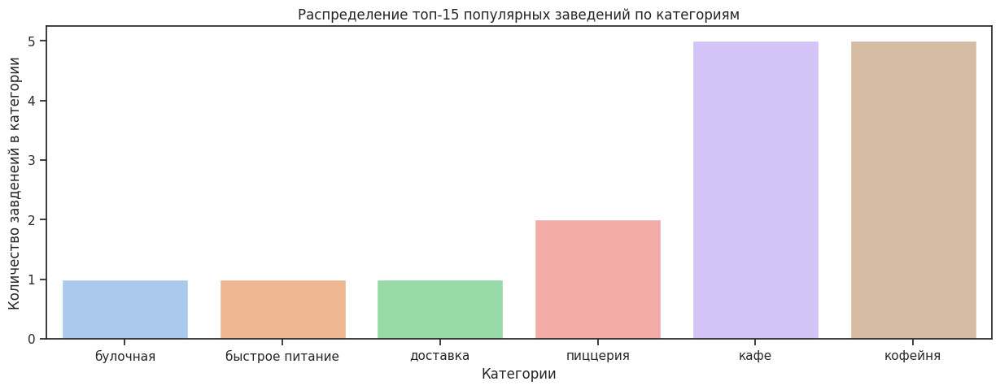

In [38]:
plt.figure(figsize=(15, 5))
sns.barplot(
    x= df_cat.sort_values().index, y= df_cat.sort_values()).set(title = 'Распределение топ-15 популярных заведений по категориям')
plt.ylabel("Количество завденеий в категории")
plt.xlabel("Категории")
plt.show()

In [29]:
def categorize(data, col1, col2, col3, title1, title2, title3):
    data1 = data.groupby([col1, col2])[col3].count().reset_index()
    data1 = data1.rename(columns={col3:'count'})
    fig = px.bar(data1.sort_values(by='count', ascending=True),
             x='count',
             y=col2,
             color=col1
            )
    fig.update_layout(title=title1,
                   xaxis_title=title2,
                   yaxis_title=title3,
                   yaxis={'categoryorder':'total ascending'},
                   width=1000,
                   height=550
                 )
    return fig.show()
categorize(df.query('name in @df3.index'), 'category', 'name', 'address','Распределение по категориям среди топ-15 популярных заведений', 'Количество заведений', 'Название заведений')

Мы видим, что среди топ-15 сетевых заведений лидируют кафе и кофейни. Далее идут пиццерии

In [30]:
df5 = df.pivot_table(index= 'category', values=['middle_avg_bill', 'rating'], aggfunc={'middle_avg_bill':'median', 'rating':'mean'})
df6 = df4.merge(df5, on='category', how='left')
df6 = df6.rename(columns={'middle_avg_bill': 'средний счет в заведении этой категории', 'rating' : 'средний рейтинг в категории'})
df6


,name,средний счет,рейтинг,category,средний счет в заведении этой категории,средний рейтинг в категории
0,CofeFest,512.50,3.98,кофейня,400.00,4.28
1,Cofix,NaN,4.08,кофейня,400.00,4.28
2,One Price Coffee,NaN,4.06,кофейня,400.00,4.28
3,Prime,300.00,4.12,кафе,550.00,4.12
4,Буханка,237.50,4.40,булочная,450.00,4.27
5,Додо Пицца,391.50,4.29,пиццерия,600.00,4.30
6,Домино'с Пицца,500.00,4.17,пиццерия,600.00,4.30
7,КОФЕПОРТ,NaN,4.15,кофейня,400.00,4.28
8,Кулинарная лавка братьев Караваевых,450.00,4.39,кафе,550.00,4.12
9,Му-Му,450.00,4.23,кафе,550.00,4.12


Я создала сводную таблицу для топ-15 сетевых заведений. К ней я присоеднила таблицу со средними данными по рейтингу и средним счетом для каждой категории

In [31]:
df51 = df5.sort_values(by= 'middle_avg_bill')

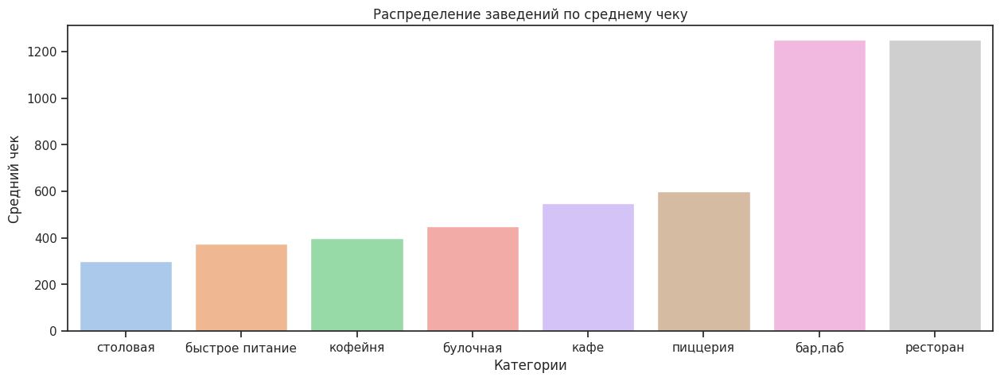

In [57]:
plt.figure(figsize=(15, 5))
sns.barplot(data = df51,
    x= df51.index, y= df51.middle_avg_bill).set(title = 'Распределение заведений по среднему чеку')
plt.ylabel("Средний чек")
plt.xlabel("Категории")
plt.show()

In [32]:
df7 = df6[['name', 'средний счет', 'средний счет в заведении этой категории']].dropna(subset=['средний счет'])
df7 = df7.sort_values(by = 'средний счет')

In [67]:
def make_barplot(data, name, y1, y2, title1, xlabel, ylabel):
    data1 = data[[name,y1,y2]]
    tidy_df = pd.melt(data1, id_vars= name, value_vars=[y1, y2], var_name='легенда', value_name='average_price')
    plt.figure(figsize=(15, 5))
    sns.barplot(x= name, y='average_price', hue='легенда', data=tidy_df, palette='pastel')
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title1)
    plt.xticks(rotation=45, ha='right')
    plt.show()

Я написала функцию, которая строит столбчатую диаграмму для двух колонок таблиц

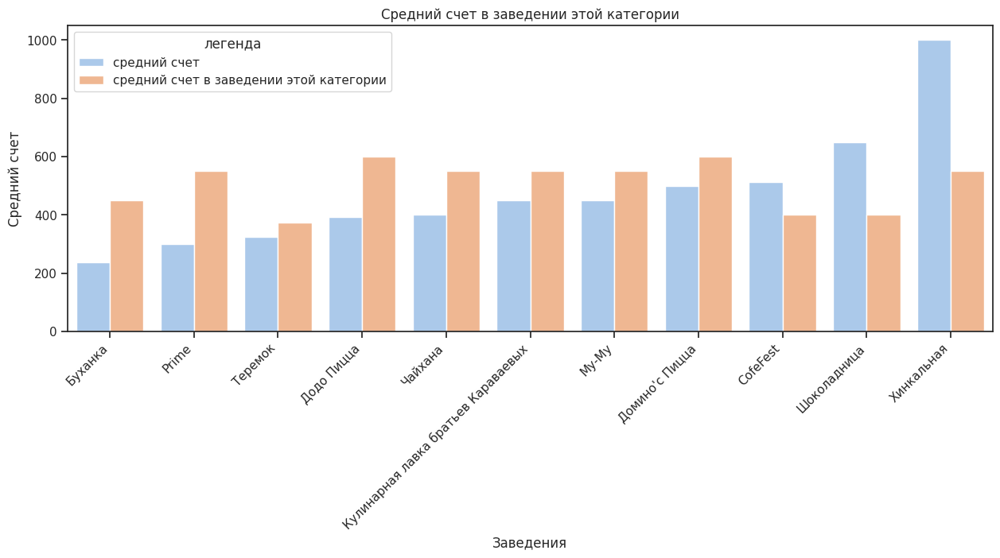

In [68]:
make_barplot(df7, 'name', 'средний счет', 'средний счет в заведении этой категории', 'Cредний счет в заведении этой категории', 'Заведения', 'Средний счет')

**Вывод:** Мы видиим, что в большинстве случаев средний чек популярных сетевых заведений Москвы ниже, чем средний чек заведения этой категории. Исключения составляют Cofefect, Хинкальная и Шоколадница. Однако, если бы мы записали Хинкальную как ресторан, то и в этом случае цены были бы ниже, чему у типового ресторана

**Наблюдение:** Мы видим, что границы между разными категориями заведений размыты и у нас нет четкого параметра, причисляющего заведение к той или иной категории. Это мешает нам быть уверенными в точности исследования, основанного на разбиении заведений по категориям.


In [35]:
df9 = df6.dropna(subset = ['рейтинг'])

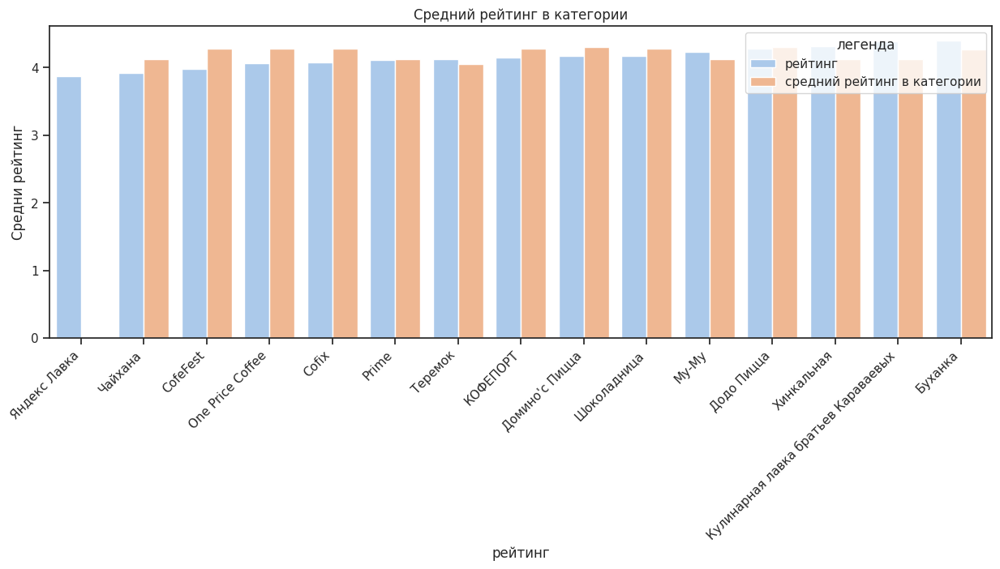

In [69]:
make_barplot(df9.sort_values(by = 'рейтинг'), 'name', "рейтинг", "средний рейтинг в категории", "Cредний рейтинг в категории", 'рейтинг', 'Cредни рейтинг')

Мы не видим явной зависимости между популярности сети и рейтингом. У многих популярных сетей средний рейтинг равен или ниже среднего рейтинга категории. Но бывают и обратные примеры('Хинкальная', 'Кулинарная Лавка братьев Караваевых', 'Буханка', 'Му-Му')

### 3.5 Исследование районов Москвы

**Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.**

In [38]:
categorize(df, 'category', 'district', 'name','Количество заведений каждой категории по районам', 'Количество заведений', 'Район')

Мы видим, что больше всего заведений в Цетральном районе Москвы (практически в 3 раза больше, чем в других районах)

Во всех районах лидируютпо количеству кафе, далее идут рестораны, кофейни и пиццерии.

Меньше всего заведений в Северо-Западном округе

### 3.6 Средние рейтинги по категориям


 Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [39]:
rating = df.groupby('category')['rating'].mean().sort_values()
rating


category
быстрое питание    4.05
кафе               4.12
столовая           4.21
булочная           4.27
кофейня            4.28
ресторан           4.29
пиццерия           4.30
бар,паб            4.39
Name: rating, dtype: float64

Мы видим, что средние значения рейтингов баров и пабов самые высокие(4.39). Далее идут пиццерии(4.3), рестораны(4.29) и кофейни(4.28). Чуть ниже средний рейтингов у кафе и заведенийтоловы быстого питания

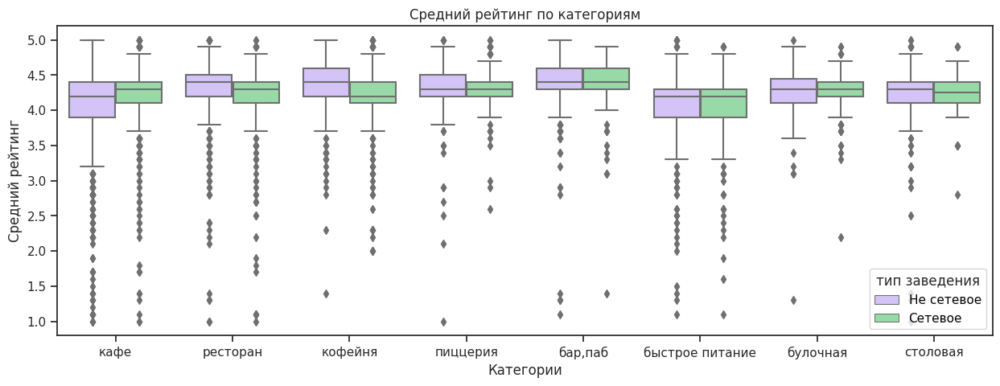

In [40]:
make_boxplots(df, 'category', 'rating', 'chain', 'Средний рейтинг по категориям', 'Категории', 'Средний рейтинг')

Вот некоторые наблюдения:

1. Самые большие расборсы по рейтингу от низких к высоким и кафе и ресторанов. Именно эти категории получили как много негативных, так и много высоких отценок. У булочных и столовых, наоборот, практисечки отсутсвуют выбросы. Видимо клиенты примерно знают, какой сервис они могут получитью

2. У несетевых кафе и у заведений быстрого питания  (как сетевых, так и нет) нижняя граница нормы самая низкая (3.2)

3. В большинстве случаев разброс от верхней до нижней границы нормы у сетевых зведений меньше, чем у несетевых. Вероятно, посетители чаще знают, чего ожидать.

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [41]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean')
rating_df

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [43]:
from folium import Map, Choropleth
import json
state_geo = 'https://drive.google.com/uc?id=1SeNygj1axxHPMxClwyu5m-qXKQnbOtfI'

moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)
m


Мы видим, что самый высокий рейтинг в заведениях центрального района

Отобразим все заведения датасета на карте с помощью кластеров

In [44]:
from folium import Map, Marker
from folium.plugins import MarkerCluster
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
      Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

df.apply(create_clusters, axis=1)
m

In [45]:
district_df = df.groupby('district', as_index=False)['name'].agg('count')
district_df = district_df.sort_values(by = 'name')
district_df.columns = ['district', 'количество заведений']

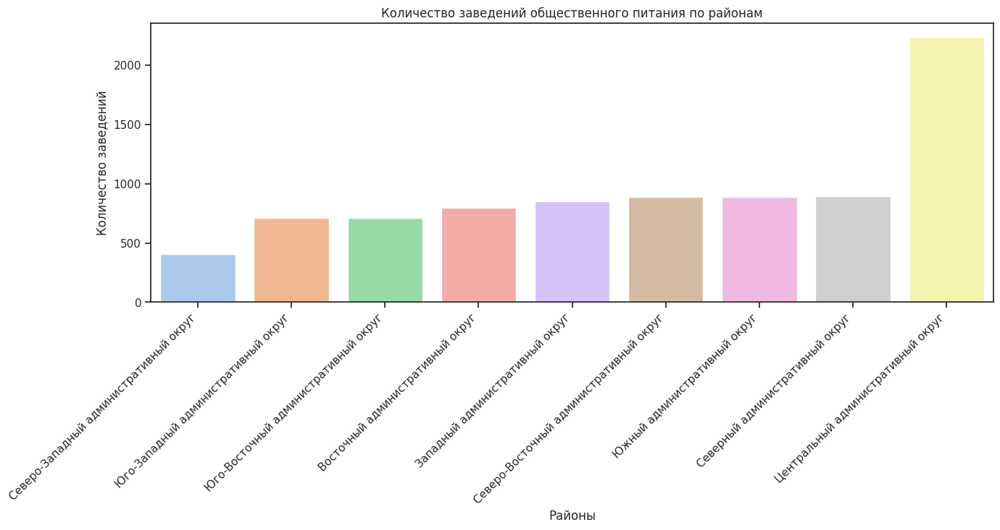

In [46]:
plt.figure(figsize=(15, 5))
sns.barplot(data = district_df,
    x= 'district', y= 'количество заведений').set(title = 'Количество заведений общественного питания по районам')
plt.ylabel("Количество заведений")
plt.xlabel("Районы")
plt.xticks(rotation=45, ha='right')
plt.show()

Где в Москве находится больше всего заведений общественного питания? Мы видим, что в центре количество заведений почти втрое больше (2242) , чем в большинстве других районов (во многих других районах Москвы количество заведений колеблется от 700 до 900). Меньше всего заведений на Северо-западном округе

 **Найдем топ-15 улиц по количеству заведений.**

 Построим график распределения количества заведений и их категорий по этим улицам.

In [47]:
df_street = df.groupby('street', as_index = False)['name'].count()
df_str1 = df_street.sort_values(by = 'name', ascending  = False).head(15)

In [48]:
df_street = df.groupby('street', as_index = False)['name'].count()
df_str1 = df_street.sort_values(by = 'name', ascending  = False).head(15)
df_str1.columns = ['улица', 'количество заведений']
df_str1 = df_str1.sort_values(by = 'количество заведений')
df_str1

,улица,количество заведений
781,Пятницкая улица,48
1309,улица Миклухо-Маклая,49
517,Кутузовский проспект,54
1154,улица Вавилова,55
547,Люблинская улица,60
550,МКАД,65
524,Ленинградское шоссе,70
298,Варшавское шоссе,76
455,Каширское шоссе,77
373,Дмитровское шоссе,88


In [49]:
street = list(df_str1['улица'])

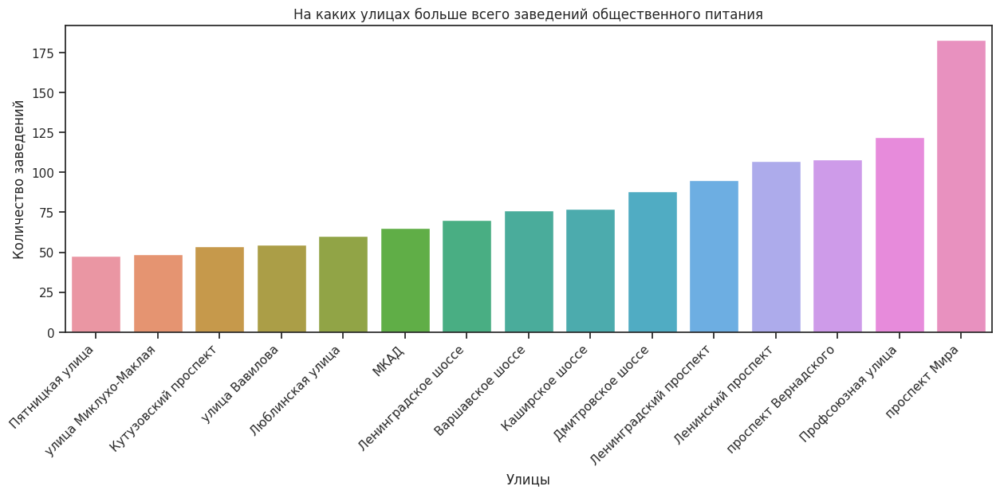

In [50]:
plt.figure(figsize=(15, 5))
sns.barplot(data = df_str1,
    x= 'улица', y= 'количество заведений').set(title = 'На каких улицах больше всего заведений общественного питания')
plt.ylabel("Количество заведений")
plt.xlabel("Улицы")
plt.xticks(rotation=45, ha='right')
plt.show()

Мы видим, что больше всего заведений общественного питания на самых длинных улицах Москвы. Это и Ленинский проспект, и Проспект Мира, и Проспект Вернадского. На этих улицах часто расположены большие троговые центры, в которых много кафе, ресторанов и заведений быстрого питания. Единственая центральная улица, попавшая в нашу выборку - Пятницкая.

Посмотрим, как распределены категории заведений на этих улицах

In [51]:
categorize(df.query('street in @street'), 'category', 'street', 'name','Количество заведений каждой категории по улицам', 'Количество заведений', 'Улицы')

Мы видим, что на топ-15 по популярности улицах Москвы заведения общественного питания распределены практически так же, как и в горое Москве. Лидируют кафе, рестораны и кофейни. Больше всего заведений на Проспекте Мира.
Есть и некоторые различия. Так, в центре на Пятницкой заметно больше ресторанов, на Мкаде практически отсутствуютпиццерии

**Найдем улицы, на которых находится только один объект общепита.**

In [52]:
df_street = df.groupby('street', as_index = False)['name'].count()
df_str2 = df_street.query('name == 1')
street1 = list(df_str2['street'])

In [53]:
df_unpop_str= df.query('street in @street1')
len(df_unpop_str)

459

Мы видим большой список улиц на самых разных районах Москвы. Большое количество таких улиц находится в центре и на Севере Москвы. Вероятно, это совсем небольшие улицы и переулки. Всего таких улиц - 459

In [54]:
df_unpop_str_gr = df_unpop_str.groupby('category', as_index = False)['name'].count().sort_values(by = 'name')
df_unpop_str_gr

,category,name
1,булочная,8
5,пиццерия,15
2,быстрое питание,23
7,столовая,36
0,"бар,паб",39
4,кофейня,84
6,ресторан,94
3,кафе,160


И здесь лидируют кафе, рестораны и кофейни. Но мы видим заметный перевес по количеству кафе.

**Узнаем средние чеки районов Москвы**

In [55]:
avg_bill_df = df.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
avg_bill_df = avg_bill_df.sort_values(by = 'middle_avg_bill')
avg_bill_df

,district,middle_avg_bill
6,Юго-Восточный административный округ,450.00
3,Северо-Восточный административный округ,500.00
8,Южный административный округ,500.00
0,Восточный административный округ,575.00
7,Юго-Западный административный округ,600.00
2,Северный административный округ,650.00
4,Северо-Западный административный округ,700.00
1,Западный административный округ,1000.00
5,Центральный административный округ,1000.00


In [56]:
df_1 = df.pivot_table(index= 'district',  columns = 'category', values= 'middle_avg_bill', aggfunc= 'median')
df_1

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,1200.00,300.00,375.00,450.00,400.00,500.00,1000.00,300.00
Западный административный округ,1250.00,600.00,367.50,625.00,600.00,700.00,1300.00,300.00
Северный административный округ,1250.00,625.00,300.00,550.00,325.00,650.00,1187.50,300.00
Северо-Восточный административный округ,900.00,500.00,425.00,475.00,325.00,500.00,837.50,275.00
Северо-Западный административный округ,1000.00,200.00,275.00,650.00,325.00,549.50,1250.00,300.00
Центральный административный округ,1250.00,962.50,450.00,700.00,500.00,1000.00,1250.00,300.00
Юго-Восточный административный округ,925.00,375.00,300.00,400.00,250.00,500.00,925.00,275.00
Юго-Западный административный округ,1000.00,500.00,375.00,450.00,375.00,500.00,1050.00,305.00
Южный административный округ,1175.00,437.50,400.00,600.00,387.50,500.00,975.00,282.50


In [57]:
df_1 = df.groupby(['category', 'district'])['middle_avg_bill'].median().reset_index()
fig = px.bar(df_1.sort_values(by='middle_avg_bill', ascending=True),
             x='middle_avg_bill',
             y= 'district',
             color= 'category'
            )

fig.update_layout(title="Средний чек по районам",
                   xaxis_title='Средний чек',
                   yaxis_title='Районы Москвы',
                   yaxis={'categoryorder':'total ascending'},
                   width=1000,
                   height=550
                 )
fig.show()

In [58]:
from folium import Map, Choropleth

state_geo = 'https://drive.google.com/uc?id=1SeNygj1axxHPMxClwyu5m-qXKQnbOtfI'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data= avg_bill_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный чек заведений по районам',
).add_to(m)

# выводим карту
m

Мы видим, что самые дороге чеки в заведениях Центрального и Юго-Западного округов.


### 3.7 Круглосуточные заведения

In [59]:
df_r = df.pivot_table (index = 'category', values = ['is_24/7'], aggfunc = {'count', 'sum'})
df_r.columns = ['всего', 'кругл']
df_r['ratio'] = df_r['кругл']/df_r['всего']*100
df_r = df_r.sort_values(by = 'ratio')
df_r.columns = ['всего', 'кругл', 'Доля круглосуточных заведений в %']
df_r = df_r.reset_index()
df_r

,category,всего,кругл,Доля круглосуточных заведений в %
0,столовая,315,12,3.81
1,кофейня,1413,59,4.18
2,пиццерия,633,31,4.90
3,ресторан,2042,135,6.61
4,"бар,паб",764,52,6.81
5,булочная,256,24,9.38
6,кафе,2376,267,11.24
7,быстрое питание,603,150,24.88


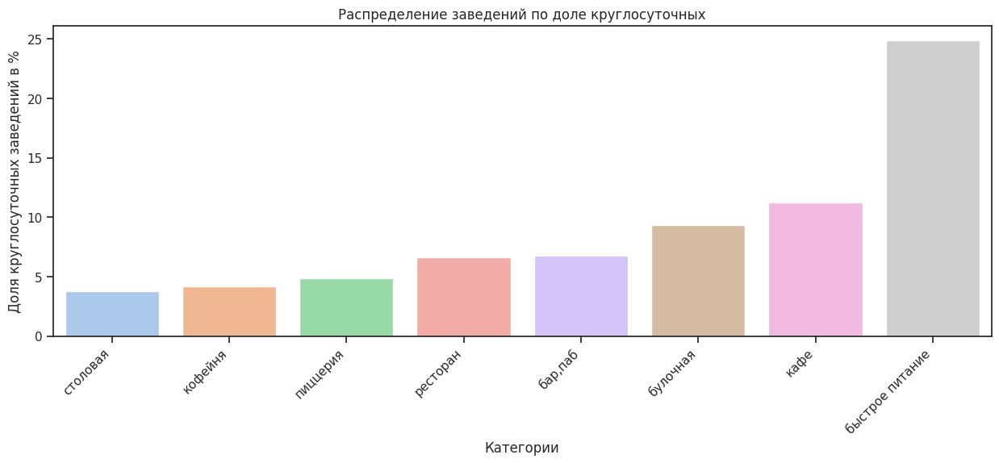

In [87]:
plt.figure(figsize=(15, 5))
sns.barplot(data = df_r,
    x= 'category', y= 'Доля круглосуточных заведений в %').set(title = 'Распределение заведений по доле круглосуточных')
plt.ylabel("Доля круглосуточных заведений в %")
plt.xlabel("Категории")
plt.xticks(rotation=45, ha='right')
plt.show()

Мы видим, что самая большая доля (примерно 25%) круглосуточных заведений относительно заведений категории - у категории быстрое питание. Далее идут кафе и булочные

In [60]:
df_r1 = df.pivot_table (index = 'district', values = ['is_24/7'], aggfunc = {'count', 'sum'})
df_r1.columns = ['всего', 'кругл']
df_r1['ratio'] = df_r1['кругл']/df_r1['всего']*100
df_r1 = df_r1.sort_values(by = 'ratio')
df_r1 = df_r1.reset_index()
df_r1

,district,всего,кругл,ratio
0,Центральный административный округ,2242,131,5.84
1,Северный административный округ,898,71,7.91
2,Южный административный округ,892,75,8.41
3,Северо-Восточный административный округ,890,75,8.43
4,Западный административный округ,850,72,8.47
5,Юго-Западный административный округ,709,73,10.30
6,Северо-Западный административный округ,409,43,10.51
7,Восточный административный округ,798,97,12.16
8,Юго-Восточный административный округ,714,93,13.03


In [89]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=df_r1,
    columns=['district', 'ratio'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Процент круглосуточных заведений по районам',
).add_to(m)
m

Мы видим, что большинство круглосуточных заведений расположены на Юго-Востоке Москвы

###3.8 Заведения с низким рейтингом

In [61]:
df_low1 = (
          df.query('rating < 3.5').pivot_table
          (index = 'category',
          values = ['name', 'middle_avg_bill'],
          aggfunc = {'name': 'count', 'middle_avg_bill':'median'})
)
df_low1.columns = ['средний счет в заведениях с низким рейтингом', 'name']
df_low1 = df_low1.reset_index().sort_values(by='name')
df_low1

,category,средний счет в заведениях с низким рейтингом,name
1,булочная,612.50,8
5,пиццерия,900.00,10
7,столовая,262.50,11
0,"бар,паб",150.00,15
4,кофейня,550.00,45
2,быстрое питание,300.00,65
6,ресторан,975.00,66
3,кафе,562.50,213


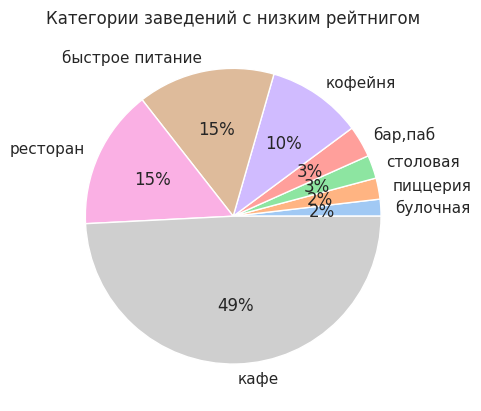

In [62]:
labels =  df_low1['category'].unique()
data = df_low1.name
colors = sns.color_palette('pastel')
plt.pie(data, labels = labels, colors = colors, autopct='%.0f%%')
plt.title('Категории заведений с низким рейтнигом')
plt.show()

Мы видим, что почти половина заведений с низким рейтингом (Я анализировала заведения, где медианные значения < 3.5) - кафе

In [63]:
df_1 = df.groupby('category')['middle_avg_bill'].median()
df_1

category
бар,паб            1250.00
булочная            450.00
быстрое питание     375.00
кафе                550.00
кофейня             400.00
пиццерия            600.00
ресторан           1250.00
столовая            300.00
Name: middle_avg_bill, dtype: float64

In [64]:
df_1 = df.groupby('category', as_index = False)['middle_avg_bill'].median()
df6 = df_low1.merge(df_1, on = 'category', how='left')
df6 = df6.rename(columns={'middle_avg_bill': 'Средний счет в заведениях категории'})

In [115]:
df6

,category,средний счет в заведениях с низким рейтингом,name,Средний счет в заведениях категории
0,булочная,612.50,8,450.00
1,пиццерия,900.00,10,600.00
2,столовая,262.50,11,300.00
3,"бар,паб",150.00,15,1250.00
4,кофейня,550.00,45,400.00
5,быстрое питание,300.00,65,375.00
6,ресторан,975.00,66,1250.00
7,кафе,562.50,213,550.00


In [65]:
df_6 = df6.sort_values(by='средний счет в заведениях с низким рейтингом')[['category', 'средний счет в заведениях с низким рейтингом', 'Средний счет в заведениях категории']]

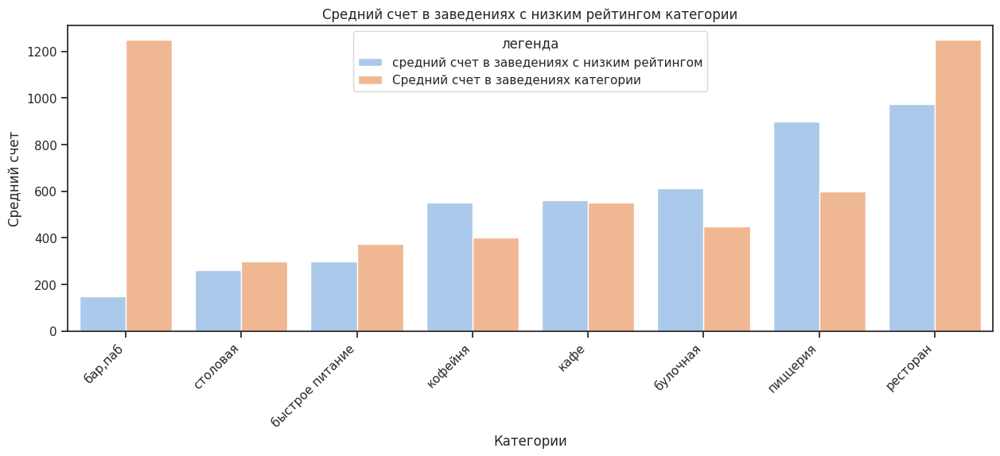

In [70]:
make_barplot(df_6, 'category', 'средний счет в заведениях с низким рейтингом',  'Средний счет в заведениях категории', 'Cредний счет в заведениях с низким рейтингом категории', 'Категории', 'Средний счет')

Мы видим, что бары и рестораны, получившие очень низкую оценку пользователей, обычно дешевые.
А вот пиццерии и булочные, которые не понравились посетителям, часто дорогие

## Изучаем рынок Москвовских кофеен

1. Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [71]:
df_cof = df.query('category == "кофейня"')
len(df_cof)

1413

В датасете 1413 кофейни

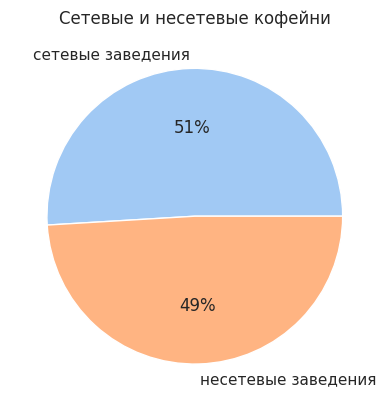

In [89]:
a1 = ['сетевые заведения', 'несетевые заведения']
b1= [sum(df_cof['chain']), len(df_cof)-sum(df_cof['chain'])]
colors = sns.color_palette('pastel')
plt.pie(b1, labels = a1, colors = colors, autopct='%.0f%%')
plt.title('Сетевые и несетевые кофейни')
plt.show()


Мы видим, что примерно половина всех кофеен - сетевые. 51% всех кофеен (720) - сетевые и 49% (693) - несетевые

In [77]:
distr_cof = df_cof.groupby('district', as_index=False)['name'].agg('count')
distr_cof

,district,name
0,Восточный административный округ,105
1,Западный административный округ,150
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
4,Северо-Западный административный округ,62
5,Центральный административный округ,428
6,Юго-Восточный административный округ,89
7,Юго-Западный административный округ,96
8,Южный административный округ,131


In [78]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=distr_cof,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество кофеен в разных районах Москвы',
).add_to(m)
m

In [ ]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
      Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

df_cof.apply(create_clusters, axis=1)
m

Мы видим, что больше всео кофеен находится в Центральном районе Москвы. На втором месте по количеству кофеен - Северный округ.

### 4.1 Доля круглосуточных кофеен

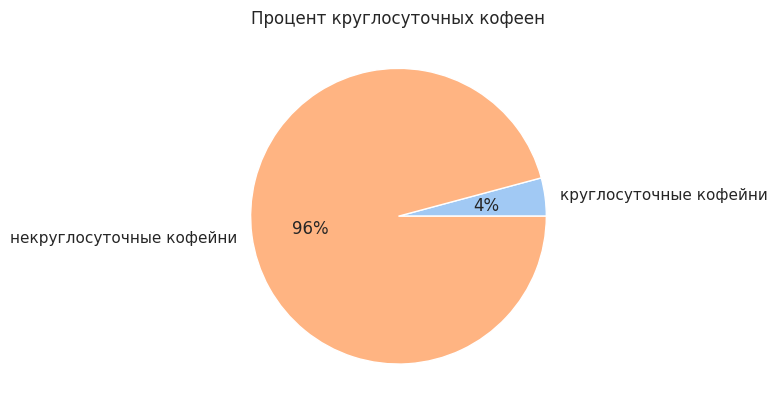

In [79]:
cof_24 = [len(df_cof[df_cof['is_24/7']]), len(df_cof)-len(df_cof[df_cof['is_24/7']])]
cof_24
a1 = ['круглосуточные кофейни', 'некруглосуточные кофейни']
colors = sns.color_palette('pastel')
plt.pie(cof_24, labels = a1, colors = colors, autopct='%.0f%%')
plt.title('Процент круглосуточных кофеен')
plt.show()




Большинство кофеен не работает круглосуточно

**Какие у кофеен рейтинги? Как они распределяются по районам?**

In [80]:
df_cof.groupby('district')['rating'].agg('mean').sort_values()

district
Западный административный округ            4.20
Северо-Восточный административный округ    4.22
Юго-Восточный административный округ       4.23
Южный административный округ               4.23
Восточный административный округ           4.28
Юго-Западный административный округ        4.28
Северный административный округ            4.29
Северо-Западный административный округ     4.33
Центральный административный округ         4.34
Name: rating, dtype: float64

У кофеен средние значения рейтинга примерно одинаковы во всех районых и равно 4.3. Чуть ниже(4.2) средние значения рейтинга кофеен Западного округа Москвы

### 4.2 Найдем 10 самых популярных кофеен Москвы

In [81]:
df_сof_top = df_cof.query('chain == 1').groupby('name')['name'].count().sort_values(ascending=False).head(10)
df_сof_top

name
Шоколадница         119
One Price Coffee     71
Cofix                65
КОФЕПОРТ             42
CofeFest             31
Кофемания            22
Cinnabon             20
Правда кофе          12
Krispy Kreme          9
Wild Bean Cafe        8
Name: name, dtype: int64

In [84]:
df_cof_t = (
          df.query('name in @df_сof_top.index').pivot_table
          (index = 'name',
          values = ['seats', 'middle_coffee_cup','rating'],
          aggfunc = 'median')
)
df_cof_t = df_cof_t.reset_index().sort_values(by="middle_coffee_cup")
df_cof_t['avg_cup'] = df_cof['middle_coffee_cup'].median()
df_cof_t = df_cof_t.rename(columns = {'middle_coffee_cup':'цена средней чашки', 'avg_cup':'чашка кофе в кофейнях Москвы'})

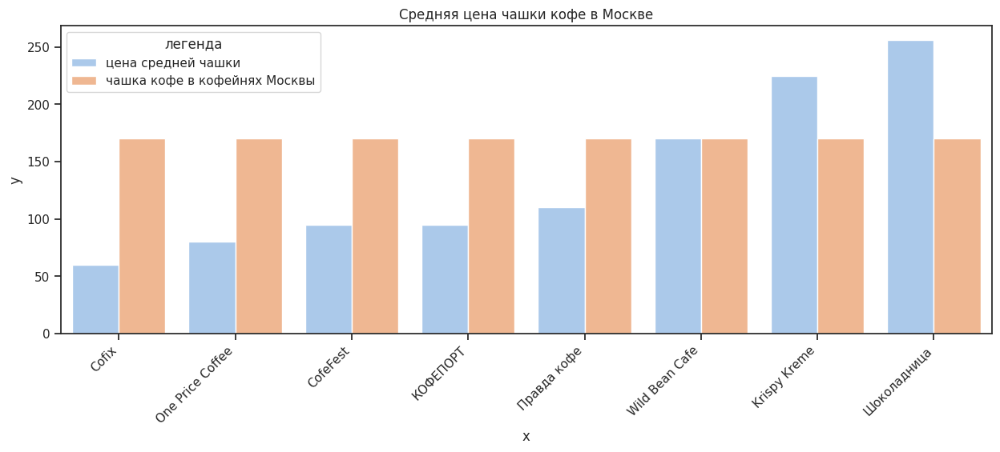

In [87]:
make_barplot(df_cof_t.dropna(subset=['цена средней чашки']), 'name', "цена средней чашки", "чашка кофе в кофейнях Москвы", "Средняя цена чашки кофе в Москве", 'x', 'y')

Мы видим, что у многих популярных кофеен средняя цена чашки кофе ниже средней цены по Москве. Однако, есть и исключения - самая популярная по количеству кофеен Шоколадница предлагает кофе дороже, чем средняя кофейня в Москве. К недешевым популярным кофейням также относится Krispy Kreme.

**Нужен ли кофейне большой зал?**

Большинство популярных кофеен, таких как Cofix, One Price Coffee, Кофепорт, Wild Bean - совсем маленькие. Они могут находиться на территории торгового центра, поэтому количество сидячих мест, которые им приписывают, вероятно находятся на территории фудкорта. Я считаю неверным оритентироваться на значения сидячих мест, указанные в датафрейме.

Такие кофейни как Шоколадница или Кофемания имеют залы побольше. Вероятно, медианные значения 96 мест для Шоколадницы выглядят более правдоподобно

## Выводы

Мы исследовали рынок общественного питания в Москве. Мы рекомендуем инвесторам
делать в выбор в пользу тех категорий заведений, которые пользуются наибольшим спросом

Итак:

1)  Мы видим, что большая часть заведений относится к категориям 'кафе', 'ресторан', 'кофейня'. Вероятно, именно эти категории наиболее перспективы для инвестиций.

2) Открывая новое заведение, стоит обращать внимание на долю сетевых заведений в этой категории. Так, в случае пиццерий и булочных мы видим, что Москвичи часто делают выбор в пользу уже раскрученных знакомых сетей. Так, в Москве 61% всех булочных и 52% всех пиццерий — сетевые. Инвестору следует либо купить франшизу уже известной сети, или вкладываться в раскрутку бренда и создавать новую узнаваемую сеть.
Среди баров, кафе и ресторанов, наоборот, значительно больше не сетевых заведений. Инвестор, открывающий бар или ресторан, может открыть одно не сетевое заведение и продумать его новую уникальную концепцию.

3) Какой район Москвы выбрать для открытия нового заведения?  Мы видим, что в центре количество заведений почти втрое больше (2242) , чем в большинстве других районов (во многих других районах Москвы количество заведений колеблется от 700 до 900). Меньше всего заведений на Северо-западном округе.
Мы рекомендуем инвесторам открывать заведения в центральном районе и выбрать для инвестиций одну из популярных категорий — ресторан, кафе или кофейню.

4) Как определиться с ценовой политикой нового заведения? Очень важно ориентироваться на средний чек выбранного района. Так, средний чек Центрального и Западного административного округа  Москвы  равен 1000 рублей, а средний чек самого дешевого Юго-Восточного округа равен 450 рублей.

5) Мы рекомендуем инвесторам учитывать данные о средних чеках заведений Москвы, устанавливая свою ценовую политику.
 Проанализировав средний чек самых популярных сетевых заведений Москвы мы видим, что средние чеки сильно зависят и от категории заведения и от района.
Так, средний чек центрального ресторана равен 1250 рублей, а средний чек ресторана на Северо-Востоке Москвы соответствует 875 рублей. Средний чек кафе колеблется от 450 (Восточный округ) до 700 руб (в центре Москвы). Более подробно ознакомиться со средними чеками ресторанов можно материалах презентации

6) На какой рейтинг стоит ориентироваться? Очень важно, чтобы ваш ресторан, бар или другое заведение общественного питания был не ниже средних рейтингов каждой конкретной категории а также примерно соответствовал среднему рейтингу  района.
Средние значения рейтингов баров и пабов самые высокие(4.39). Далее идут пиццерии(4.3), рестораны(4.29) и кофейни(4.28). Чуть ниже средний рейтингов у кафе и заведений быстрого питания
 Самые лучшие по отзывам заведения находятся в центре. Средний рейтинг центральных заведений — 4.39. Следующий район по уровню рейтинга - Северный административный округ. Средний рейтинг — 4.24

7) Насколько важно, чтобы ваше заведение работало круглосуточно?
Самая большая доля (примерно 25%) круглосуточных заведений относительно заведений категории - у категории быстрое питание, далее идут кафе(11% круглосуточных) и булочные.
Среди баров, как ни странно, только 6% работают круглосуточно. Мы видим, что большинство круглосуточных заведений расположены на Юго-Востоке Москвы
Таким образом, если ваше заведение не относится к категории быстрого питания, мы предполагаем что делать его круглосуточным совсем не обязательно

8) Что выделяет заведения, получившие низкий рейтинг? Мы видим, что бары и рестораны, получившие очень низкую оценку пользователей, обычно дешевые. А пиццерии и булочные, которые не понравились посетителям, часто дорогие.
Можно сделать вывод, что бары и рестораны чаще посещают обеспеченные люди, которые готовы заплатить за хороший сервис. А вот посетители пиццерий, привыкшие к ценам популярных сетевых заведений, часто бывают разочарованы неоправданно высокими ценами.

9) ) Чем выделяются самые популярные сетевые заведения Москвы? Мы исследовали топ-15 по популярности сетевых заведений Москвы. Среди них лидируют кафе и кофейни. На третьем месте популярности находятся пиццерии.
В большинстве случаев средний чек популярных сетевых заведений Москвы ниже, чем средний чек заведения этой категории. Исключения составляют Cofefest и Шоколадница.
В случае, если вы присматриваетесь к созданию новой сети заведений общественного питания, важно учитывать цены существующих сетей как ориентир. С ценами вы можете ознакомиться в нашей презентации

10) Что порекомендовать инвесторам, задумывающихся об открытии кофейни в Москве?
- Мы видим, что больше всего кофеен находится в Центральном районе Москвы. На втором месте по количеству кофеен - Северный округ. Вероятно, именно в этих районах больший спрос на кофе.
- Достаточно большой процент кофеен принадлежат к сетевым заведениям. 51% всех кофеен (720) - сетевые и 49% (693) — не сетевые. Вероятно, москвичи чаще покупают кофе знакомых  брендов. Вероятно, инвестору стоит либо приобрести франшизы уже существующей сети, либо продумать стратегии раскрутки нового бренда и создания новой сети кофеен
-  Большинство кофеен не работает круглосуточно
- У кофеен средние значения рейтинга примерно одинаковы во всех районах и равно 4.3. Чуть ниже(4.2) средние значения рейтинга кофеен Западного округа Москвы. Именно на такую оцеку сервиса стоит ориентироваться.
- У многих популярных кофеен средняя цена чашки кофе ниже средней цены по Москве. Так, средняя чашка кофе по Москве стоит 170 рублей, а в популярных сетях, таких как Coffix или One price Coffee, средняя чашка кофе стоит  60 и 80 рублей соответственно. К недешевым популярным кофейням также относится Krispy Kreme и Шоколадница.






## Ссылка на презентацию

https://disk.yandex.ru/i/NCdgKanUnFVZlQ